In [1]:
import os
import pandas as pd
import scanpy as sc
from sklearn import metrics
import multiprocessing as mp

In [2]:
file_fold = r"D:\project\Visium_HD_Human_Lung_Cancer_binned_outputs\binned_outputs\square_008um"


In [3]:
adata = sc.read_visium(file_fold, count_file='filtered_feature_bc_matrix.h5', load_images=True)
adata.var_names_make_unique()


C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\anndata\_core\anndata.py:1900: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\anndata\_core\anndata.py:1900: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\readwrite.py:412: DtypeWarning: Columns (1,2,3,4,5) have mixed types. Specify dtype option on import or set low_memory=False.
  positions = pd.read_csv(files['tissue_positions_file'], header=None)


In [4]:
adata.obsm["spatial"] = adata.obsm["spatial"].astype(float)

In [5]:
adata = adata[adata.obs["in_tissue"] == 1].copy()

In [6]:
x_min, x_max = 12000, 15000
y_min, y_max = 10000, 13000


In [7]:
mask = (
    (adata.obsm['spatial'][:, 0] >= x_min) & (adata.obsm['spatial'][:, 0] <= x_max) &
    (adata.obsm['spatial'][:, 1] >= y_min) & (adata.obsm['spatial'][:, 1] <= y_max)
)
adata = adata[mask].copy()
print(f"Subset shape: {adata.shape}")


Subset shape: (14880, 18085)


In [8]:
banksy_adata = adata

In [9]:
banksy_adata.var_names_make_unique()

In [10]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.scale(adata, max_value=10)


In [11]:
from banksy.main import generate_spatial_weights_fixed_nbrs, weighted_concatenate, banksy_matrix_to_adata

coords = adata.obsm["spatial"]
adj, _, _ = generate_spatial_weights_fixed_nbrs(
    locations=coords,
    m=0,
    num_neighbours=15,
    decay_type="scaled_gaussian"
)


---- Ran generate_spatial_distance_graph in 0.13 s ----

normalized sum from ptr 0 to 15 (15 entries) 1.0
normalized sum from ptr 15 to 30 (15 entries) 0.9999999999999999
normalized sum from ptr 30 to 45 (15 entries) 1.0
normalized sum from ptr 45 to 60 (15 entries) 0.9999999999999999
normalized sum from ptr 60 to 75 (15 entries) 0.9999999999999997
normalized sum from ptr 75 to 90 (15 entries) 1.0000000000000002
normalized sum from ptr 90 to 105 (15 entries) 1.0000000000000002
normalized sum from ptr 105 to 120 (15 entries) 0.9999999999999998
normalized sum from ptr 120 to 135 (15 entries) 1.0
normalized sum from ptr 135 to 150 (15 entries) 1.0
normalized sum from ptr 150 to 165 (15 entries) 0.9999999999999998
normalized sum from ptr 165 to 180 (15 entries) 0.9999999999999999
normalized sum from ptr 180 to 195 (15 entries) 1.0
normalized sum from ptr 195 to 210 (15 entries) 0.9999999999999999
normalized sum from ptr 210 to 225 (15 entries) 0.9999999999999998
normalized sum from ptr 225

In [12]:
banksy_X = weighted_concatenate(
    adata.X,
    adj @ adata.X,
    0.4 
)

banksy_adata = banksy_matrix_to_adata(banksy_X, adata)


---- Ran weighted_concatenate in 4.82 s ----

num_nbrs: 18085


In [13]:
print(banksy_adata)


AnnData object with n_obs × n_vars = 14880 × 36170
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'mean', 'std', 'is_nbr'


In [14]:
banksy_adata.obsm["spatial"] = adata.obsm["spatial"].copy()


In [15]:
banksy_adata.uns["spatial"] = adata.uns.get("spatial", {})


In [16]:
sc.pp.pca(banksy_adata)
sc.pp.neighbors(banksy_adata)
sc.tl.umap(banksy_adata)
sc.tl.leiden(banksy_adata, resolution=1)


C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


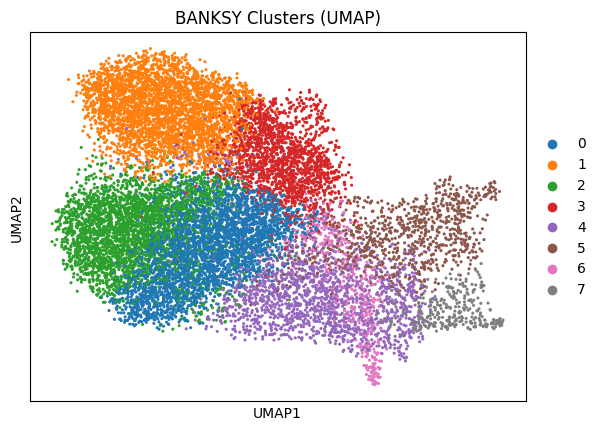

C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


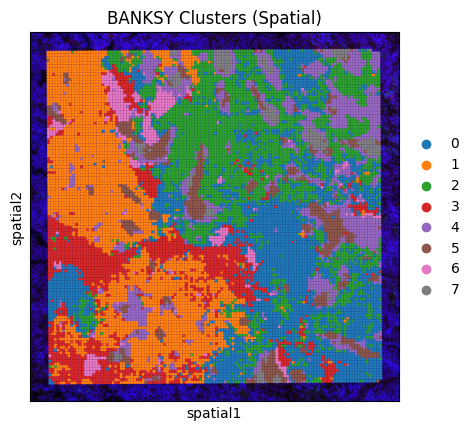

In [17]:
sc.pl.umap(banksy_adata, color="leiden", title="BANKSY Clusters (UMAP)", size=20)
sc.pl.spatial(banksy_adata, color="leiden", title="BANKSY Clusters (Spatial)", spot_size=30)


In [18]:
banksy_adata

AnnData object with n_obs × n_vars = 14880 × 36170
    obs: 'in_tissue', 'array_row', 'array_col', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'mean', 'std', 'is_nbr'
    uns: 'spatial', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\numpy\core\fromnumeric.py:84: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\tools\_rank_genes_groups.py:422: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\tools\_rank_genes_groups.py:422: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\tools\_rank_genes_groups.py:422: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\suhas\anaconda3\envs\banksy_en

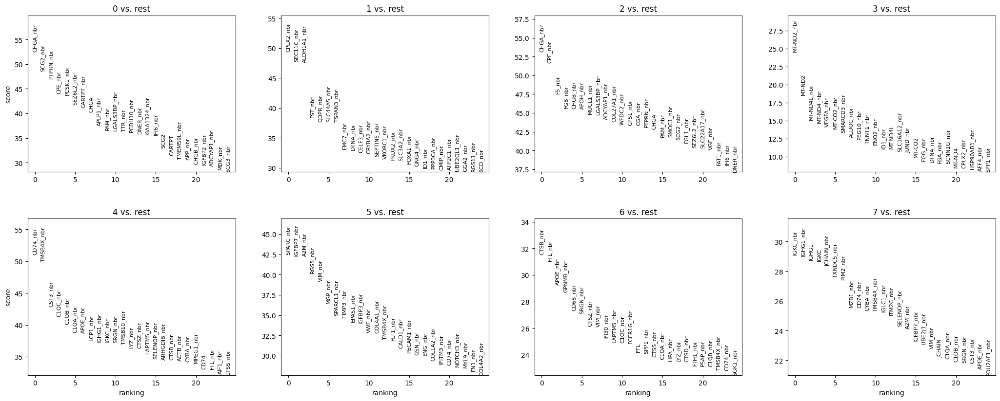

In [19]:
sc.tl.rank_genes_groups(
    banksy_adata,
    groupby="leiden",
    method="wilcoxon"
)
sc.pl.rank_genes_groups(banksy_adata, n_genes=25, sharey=False, title="Leiden Cluster Markers")

## I MORANS

In [20]:
import squidpy as sq

sq.gr.spatial_neighbors(banksy_adata)

C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\dask\dataframe\__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(


In [28]:
sq.gr.spatial_autocorr(banksy_adata, mode="moran")

C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\metrics\_gearys_c.py:293: UserWarning: 6320 variables were constant, will return nan for these.
  warnings.warn(


In [29]:
top_genes = banksy_adata.uns["moranI"].sort_values("I", ascending=False).head(20).index.tolist()
print("Top spatially variable genes by Moran's I:", top_genes)

Top spatially variable genes by Moran's I: ['IGKC_nbr', 'IGHG1_nbr', 'CHGA_nbr', 'VGF_nbr', 'FGB_nbr', 'IGHG3_nbr', 'IGLC1_nbr', 'JCHAIN_nbr', 'CARTPT_nbr', 'CPE_nbr', 'RGS5_nbr', 'CGA_nbr', 'SCG2_nbr', 'CD74_nbr', 'IGHM_nbr', 'IGHA1_nbr', 'FGA_nbr', 'TMSB4X_nbr', 'IGFBP3_nbr', 'CXCL9_nbr']


C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


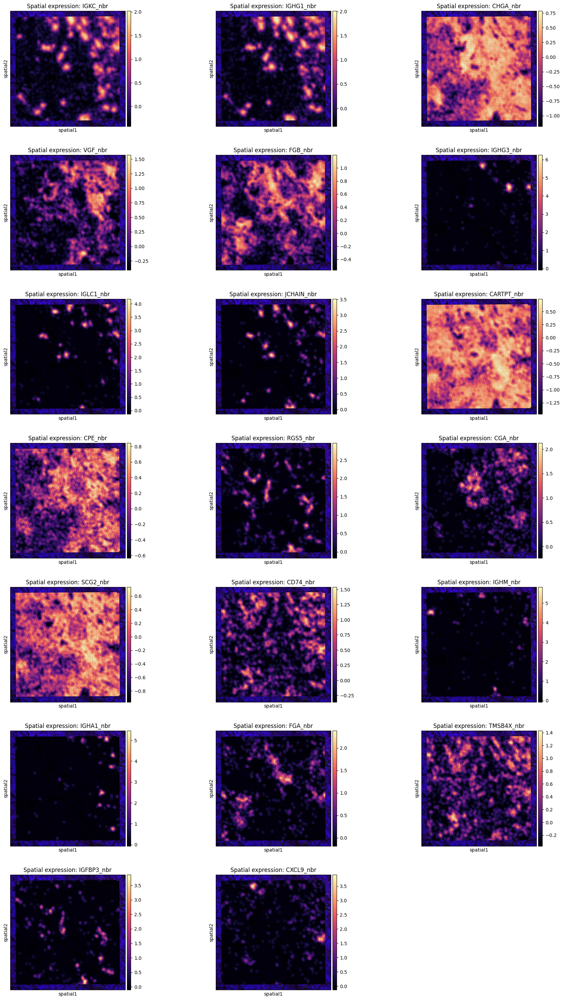

In [30]:
import scanpy as sc

sc.pl.spatial(
    banksy_adata,
    color=top_genes,
    cmap="magma",
    spot_size=30,
    ncols=3,
    title=[f"Spatial expression: {gene}" for gene in top_genes]
)

In [31]:
adata

AnnData object with n_obs × n_vars = 14880 × 18085
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'mean', 'std'
    uns: 'spatial', 'log1p'
    obsm: 'spatial'

In [32]:
import squidpy as sq

sq.gr.spatial_neighbors(banksy_adata)

  0%|          | 0/1 [00:00<?, ?/s]

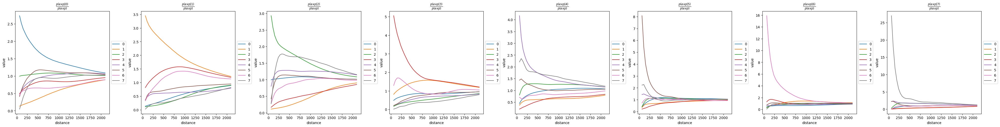

In [33]:
sq.gr.co_occurrence(banksy_adata, cluster_key="leiden")
sq.pl.co_occurrence(banksy_adata, cluster_key="leiden")

  0%|          | 0/1000 [00:00<?, ?/s]

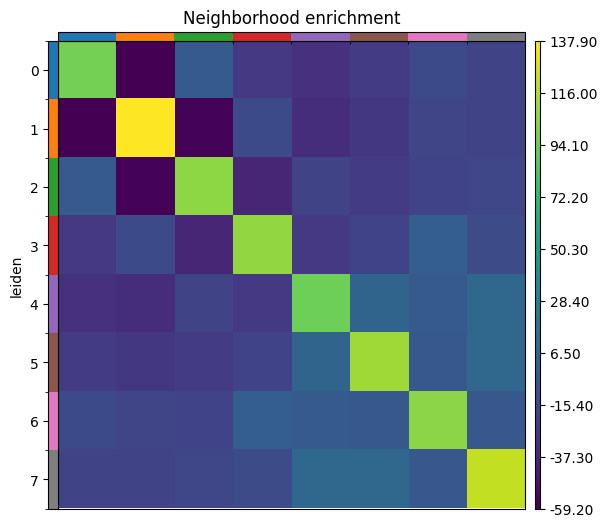

In [34]:
sq.gr.nhood_enrichment(banksy_adata, cluster_key="leiden")
sq.pl.nhood_enrichment(banksy_adata, cluster_key="leiden")

In [28]:
print("banksy_adata.obsm keys:", banksy_adata.obsm.keys())



banksy_adata.obsm keys: KeysView(AxisArrays with keys: spatial, X_pca, X_umap)


In [29]:
import numpy as np
import pandas as pd

def count_significant_genes_banksy(pval_threshold=0.05, inclusive=True, sort_desc=True):
    if "rank_genes_groups" not in banksy_adata.uns:
        raise ValueError("rank_genes_groups not found in banksy_adata.uns. "
                         "Run sc.tl.rank_genes_groups(...) first.")

    rgg = banksy_adata.uns["rank_genes_groups"]

    # choose p-value key
    if "pvals_adj" in rgg:
        pval_key = "pvals_adj"
    elif "pvals" in rgg:
        pval_key = "pvals"
    else:
        raise ValueError("No p-values found in rank_genes_groups (neither 'pvals_adj' nor 'pvals').")

    groups = rgg["names"].dtype.names
    op = (np.less_equal if inclusive else np.less)

    rows = []
    for g in groups:
        pvals = rgg[pval_key][g]
        pvals = np.ma.filled(pvals, np.nan).astype(float)  # handle masked/NaNs
        mask = np.isfinite(pvals)
        n_total = int(mask.sum())
        n_sig = int(op(pvals[mask], pval_threshold).sum())
        frac = (n_sig / n_total) if n_total > 0 else np.nan
        rows.append({
            "cluster": g,
            "significant_genes": n_sig,
            "tested_genes": n_total,
            "fraction_significant": frac
        })

    df = pd.DataFrame(rows)
    if sort_desc:
        df = df.sort_values("significant_genes", ascending=False).reset_index(drop=True)
    return df

# Example usage
print(count_significant_genes_banksy(pval_threshold=5e-5))


  cluster  significant_genes  tested_genes  fraction_significant
0       1               6917         36170              0.191236
1       5               5118         36170              0.141498
2       3               3692         36170              0.102074
3       7               3381         36170              0.093475
4       4               3290         36170              0.090959
5       2               2983         36170              0.082472
6       0               2939         36170              0.081255
7       6               1839         36170              0.050843


In [30]:
import pandas as pd
import numpy as np
import gseapy as gp
from scipy import sparse

# ---------- 1. Count significant genes ----------
def count_significant_genes(banksy_adata, pval_threshold=1):
    result = banksy_adata.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    counts = []
    for group in groups:
        pvals = result['pvals_adj'][group]
        num_significant = (pvals < pval_threshold).sum()
        counts.append({'cluster': group, 'significant_genes': num_significant})
    return pd.DataFrame(counts)

print(count_significant_genes(banksy_adata, pval_threshold=0.00005))


# ---------- 2. Get all ranked DE genes ----------
def get_all_ranked_genes(adata):
    result = adata.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    dfs = []
    for group in groups:
        n_genes = len(result['names'][group])
        df = pd.DataFrame({
            'cluster': group,
            'gene': result['names'][group],
            'pval_adj': result['pvals_adj'][group]
        }, index=range(n_genes))
        dfs.append(df)
    return pd.concat(dfs, ignore_index=True)

top_markers_banksy = get_all_ranked_genes(banksy_adata)


# ---------- 3. Enrichment (Enrichr, top-N per cluster) ----------
TOP_N_GENES = 100   # match GraphST style (short, sharp lists)

top_markers_sorted = top_markers_banksy.sort_values(['cluster','pval_adj'], ascending=[True, True])
top_per_cluster = top_markers_sorted.groupby('cluster').head(TOP_N_GENES)

significant_genes_by_cluster = top_per_cluster.groupby('cluster')['gene'].apply(list).to_dict()

A = banksy_adata.raw.X if (banksy_adata.raw is not None) else banksy_adata.X
nnz = A.getnnz(axis=0) if sparse.issparse(A) else np.count_nonzero(A, axis=0)
background = list(banksy_adata.var_names[np.asarray(nnz).ravel() >= 3])

# Enrichment per cluster
for cluster, genes in significant_genes_by_cluster.items():
    enr = gp.enrichr(
        gene_list=genes,
        gene_sets='GO_Biological_Process_2021',
        organism='Human',
        background=background,  
        outdir=None,
        cutoff=3.0
    )
    print(f"\nTop enriched GO terms for cluster {cluster}:")
    print(enr.results[['Term','Adjusted P-value']].head())


  cluster  significant_genes
0       0               2939
1       1               6917
2       2               2983
3       3               3692
4       4               3290
5       5               5118
6       6               1839
7       7               3381

Top enriched GO terms for cluster 0:
                                                Term  Adjusted P-value
0  positive regulation of cardiac muscle contract...          0.143418
1                     protein secretion (GO:0009306)          0.143418
2  regulation of transmission of nerve impulse (G...          0.143418
3  negative regulation of response to food (GO:00...          0.143418
4   regulation of epinephrine secretion (GO:0014060)          0.143418

Top enriched GO terms for cluster 1:
                                                Term  Adjusted P-value
0  positive regulation of cardiac muscle contract...          0.155164
1  positive regulation of striated muscle contrac...          0.155164
2  regulation of relaxat

# Label Names

Cluster 1 — "Muscle Contraction & Mast Cell Activation"
GO: cardiac/striated muscle contraction, catecholamine secretion, mast cell activation
Indicates contractile-like signaling and immune activation, pointing to stromal or mast cell–linked biology.

Cluster 2 — "Apoptosis & Protein Metabolism"
GO: regulation of endothelial/epithelial apoptosis, protein metabolic processes
Represents stress-response and survival pathways, possibly involving apoptotic regulation in immune or stromal cells.

Cluster 3 — "Neural Signaling & Stress Response"
GO: nerve impulse regulation, epinephrine secretion, striated muscle contraction
Highlights neuronal-like stress-response signaling, consistent with tissue–nerve or stress-related programs.

Cluster 4 — "Transcription & Immune Modulation"
GO: RNA polymerase II regulation, type 2 immune response, prostaglandin biosynthesis
Suggests transcriptional reprogramming with immune modulatory roles, possibly stromal–immune crosstalk zones.

Cluster 5 — "Coagulation & Complement Control"
GO: intrinsic coagulation pathway, complement activation, innate immune regulation
Indicates vascular/endothelial-related biology with immune suppression and coagulation activity.

Cluster 6 — "Iron & Lipid Metabolism"
GO: iron ion sequestration, sterol/cholesterol biosynthesis regulation, lipoprotein metabolism
Points to metabolic activity involving iron and lipid homeostasis, likely macrophage or metabolic niches.

Cluster 7 — "Inflammatory & Chemokine Signaling"
GO: prostaglandin biosynthesis, respiratory burst, type 2 immune response
Represents inflammatory signaling and chemotactic activity, possibly immune-rich or B/T-cell–interfacing zones.

C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


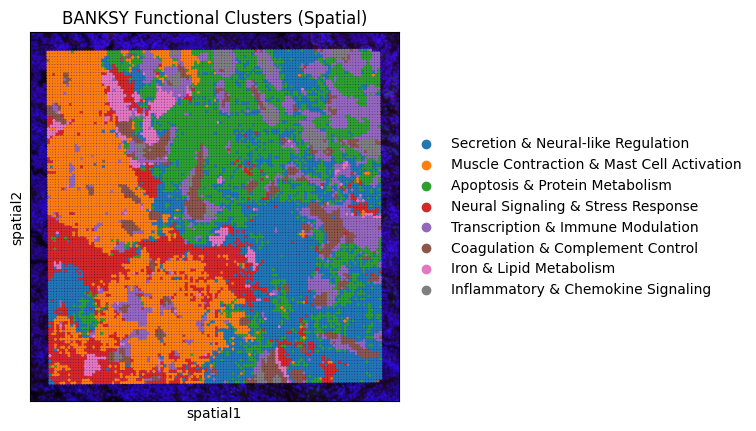

In [31]:
import scanpy as sc

# Map Leiden clusters → descriptive names
cluster_labels = {
    "0": "Secretion & Neural-like Regulation",
    "1": "Muscle Contraction & Mast Cell Activation",
    "2": "Apoptosis & Protein Metabolism",
    "3": "Neural Signaling & Stress Response",
    "4": "Transcription & Immune Modulation",
    "5": "Coagulation & Complement Control",
    "6": "Iron & Lipid Metabolism",
    "7": "Inflammatory & Chemokine Signaling"
}

banksy_adata.obs["Cluster_Label"] = banksy_adata.obs["leiden"].map(cluster_labels)

# Spatial plot with custom labels
sc.pl.spatial(
    banksy_adata,
    color="Cluster_Label",
    title="BANKSY Functional Clusters (Spatial)",
    spot_size=30
)


In [32]:
print(adata)

AnnData object with n_obs × n_vars = 14880 × 18085
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'mean', 'std'
    uns: 'spatial', 'log1p'
    obsm: 'spatial'


In [33]:
marker_dict = {}
rank_res = banksy_adata.uns['rank_genes_groups']
groups = rank_res['names'].dtype.names

for group in groups:
    marker_dict[group] = [rank_res['names'][group][i] for i in range(2)]

C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


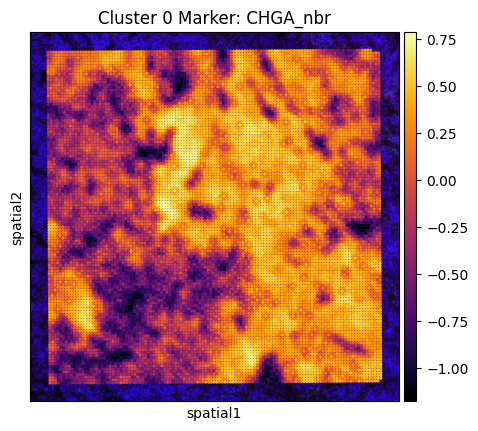

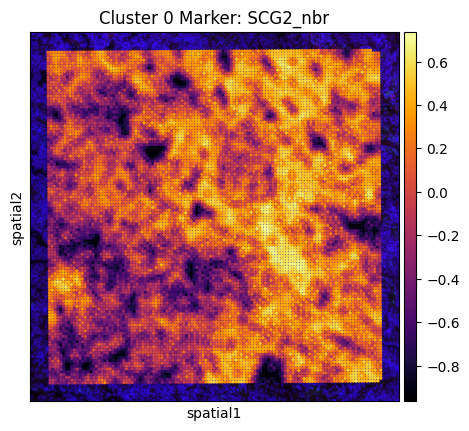

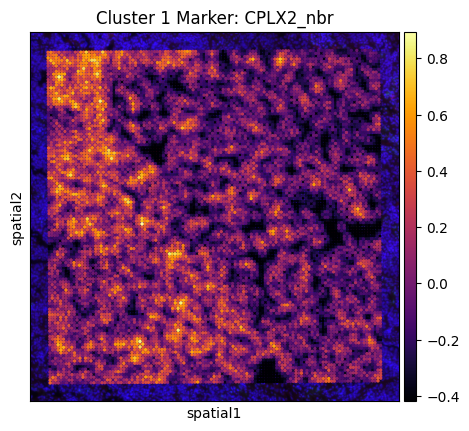

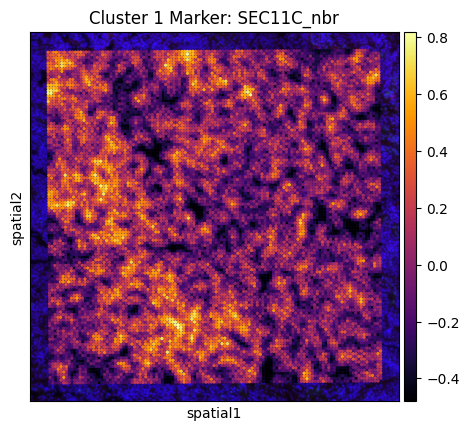

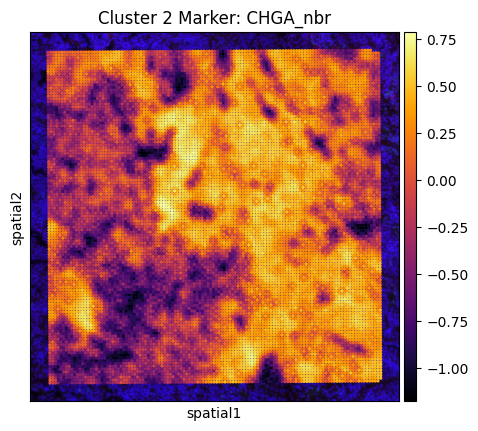

...

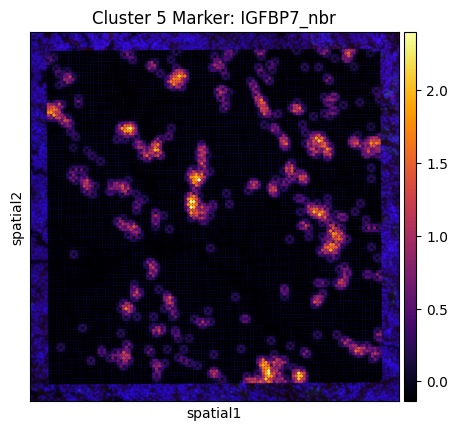

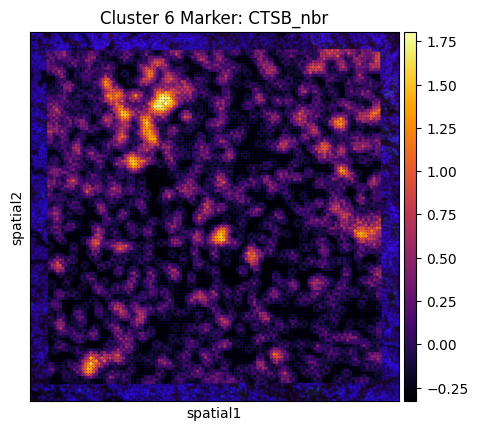

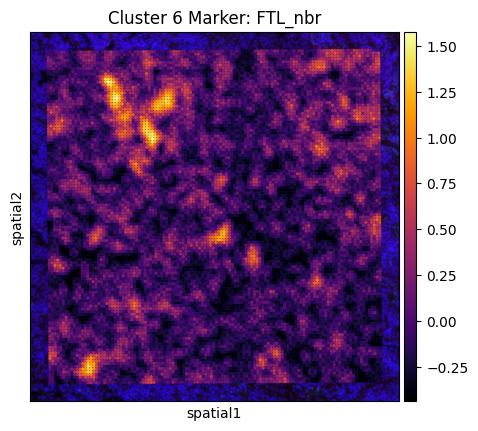

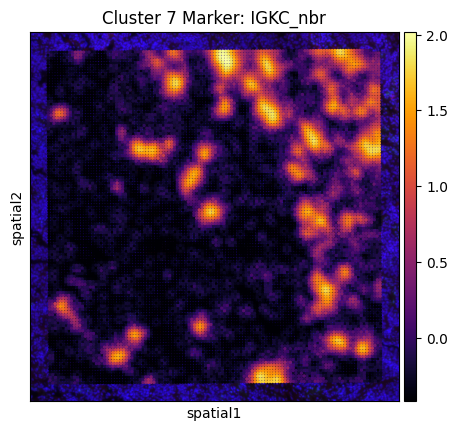

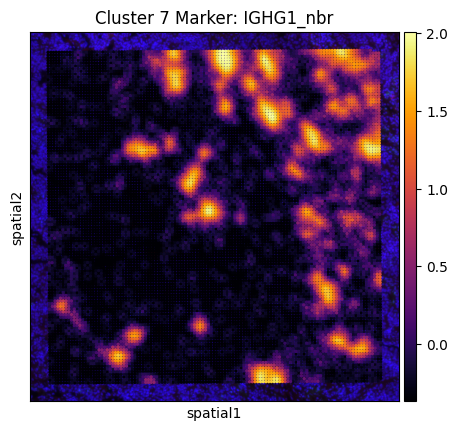

In [34]:
import matplotlib.pyplot as plt
import scanpy as sc

for cluster, genes in marker_dict.items():
    for gene in genes:
        sc.pl.spatial(
            banksy_adata,
            color=gene,
            img_key='hires',
            title=f"Cluster {cluster} Marker: {gene}",
            spot_size=30,
            cmap='inferno',  # or 'magma', 'viridis' etc.
            show=True
        )

In [35]:
# Computes average expression per cluster
mean_expr = adata.to_df().groupby(banksy_adata.obs['leiden']).mean()


mean_expr.to_csv("banksy_cluster_avg_expr.csv")

C:\Users\suhas\AppData\Local\Temp\ipykernel_9208\3423778894.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_expr = adata.to_df().groupby(banksy_adata.obs['leiden']).mean()


In [39]:
import pandas as pd

# Load SingleR results
singleR_results = pd.read_csv("banksy_cluster_singleR_labels.csv", index_col=0)

# Map back to adata.obs
label_map = singleR_results['labels'].to_dict()
banksy_adata.obs['SingleR_label'] = banksy_adata.obs['leiden'].astype(str).map(label_map)

C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


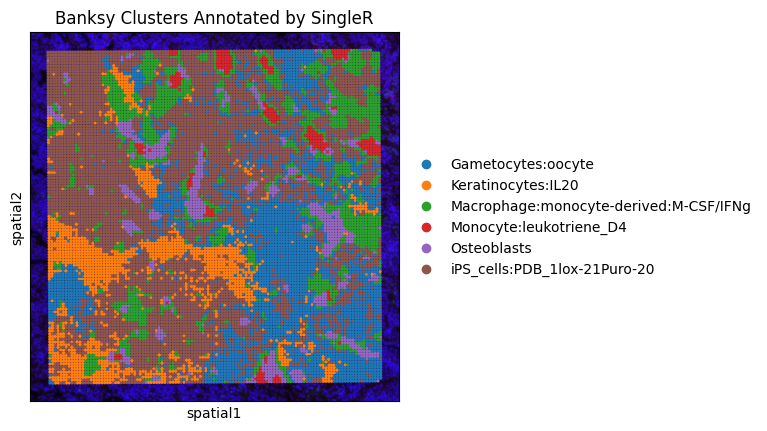

In [41]:
import pandas as pd
import scanpy as sc

# Load the SingleR results
singleR_results = pd.read_csv("banksy_cluster_singleR_labels.csv", index_col=0)

# Create mapping: cluster number (as string) → label
label_map = {str(i): label for i, label in enumerate(singleR_results['labels'].values)}

# Map to adata.obs['domain'] and handle unmapped cases
banksy_adata.obs['SingleR_label'] = banksy_adata.obs['leiden'].astype(str).map(label_map)
banksy_adata.obs['SingleR_label'].fillna("Unlabeled", inplace=True)

# Plot spatial annotation
sc.pl.spatial(
    banksy_adata,
    color='SingleR_label',
    spot_size=30,
    title='Banksy Clusters Annotated by SingleR',
    legend_loc='right margin'
)

C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


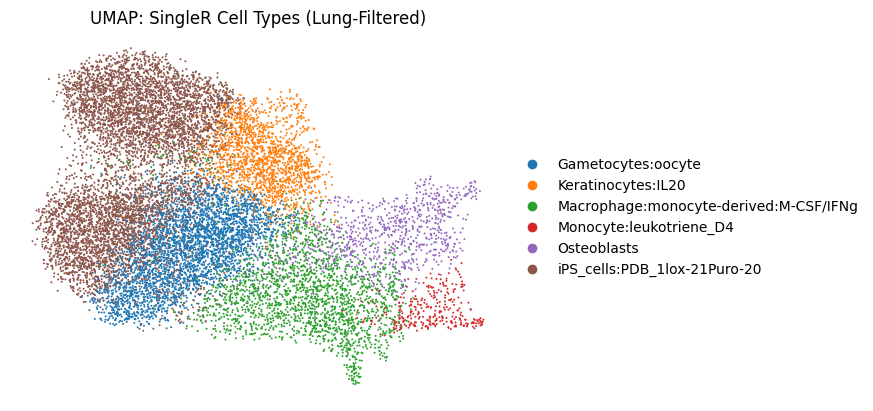

In [42]:
sc.pl.umap(
    banksy_adata,
    color='SingleR_label',
    title='UMAP: SingleR Cell Types (Lung-Filtered)',
    frameon=False
)

In [43]:
import gseapy as gp

# EMT: GO:0001837 (epithelial to mesenchymal transition)
emt_enrichr = gp.get_library(name='GO_Biological_Process_2021')
emt_genes = emt_enrichr['epithelial to mesenchymal transition (GO:0001837)']

# ECM remodeling: GO:0030198
ecm_genes = emt_enrichr['extracellular matrix organization (GO:0030198)']

# T cell activation: GO:0042110
tcell_genes = emt_enrichr['T cell activation (GO:0042110)']

In [44]:
def filter_geneset(genes, banksy_adata):
    return [gene for gene in genes if gene in adata.var_names]
emt_genes_filtered = filter_geneset(emt_genes, banksy_adata)
ecm_genes_filtered = filter_geneset(ecm_genes, banksy_adata)
tcell_genes_filtered = filter_geneset(tcell_genes, banksy_adata)
sc.tl.score_genes(banksy_adata, emt_genes_filtered, score_name='EMT_score')
sc.tl.score_genes(banksy_adata, ecm_genes_filtered, score_name='ECM_score')
sc.tl.score_genes(banksy_adata, tcell_genes_filtered, score_name='Tcell_score')

In [45]:
print("EMT genes used:", len(emt_genes_filtered))
print("ECM genes used:", len(ecm_genes_filtered))
print("Tcell genes used:", len(tcell_genes_filtered))

EMT genes used: 44
ECM genes used: 293
Tcell genes used: 86


C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


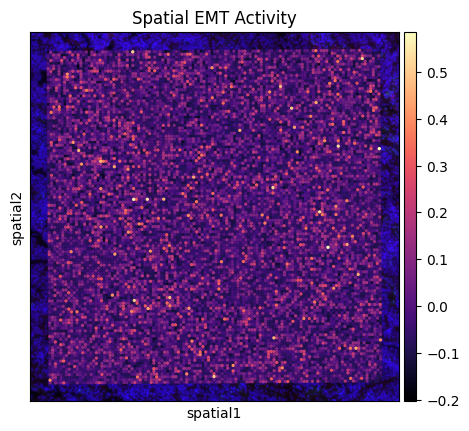

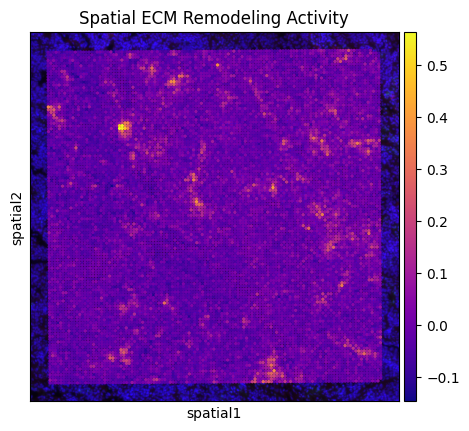

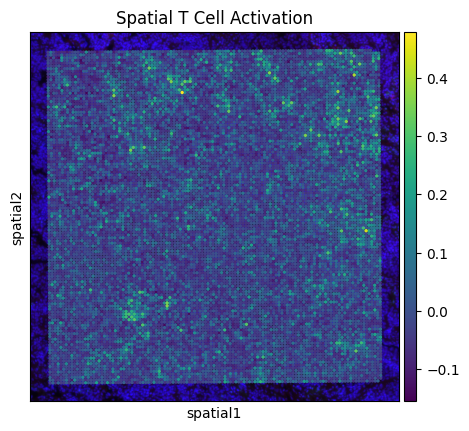

In [46]:
# EMT Activity
sc.pl.spatial(
    banksy_adata,
    color="EMT_score",
    cmap="magma",
    spot_size=30,
    title="Spatial EMT Activity"
)

# ECM Remodeling
sc.pl.spatial(
    banksy_adata,
    color="ECM_score",
    cmap="plasma",
    spot_size=30,
    title="Spatial ECM Remodeling Activity"
)

# T Cell Activation
sc.pl.spatial(
    banksy_adata,
    color="Tcell_score",
    cmap="viridis",
    spot_size=30,
    title="Spatial T Cell Activation"
)


In [47]:
adata

AnnData object with n_obs × n_vars = 14880 × 18085
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'mean', 'std'
    uns: 'spatial', 'log1p'
    obsm: 'spatial'

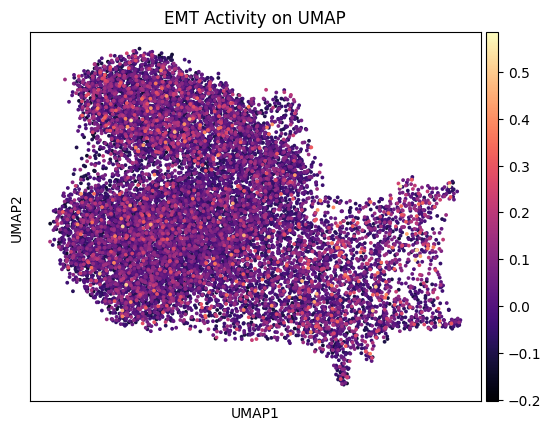

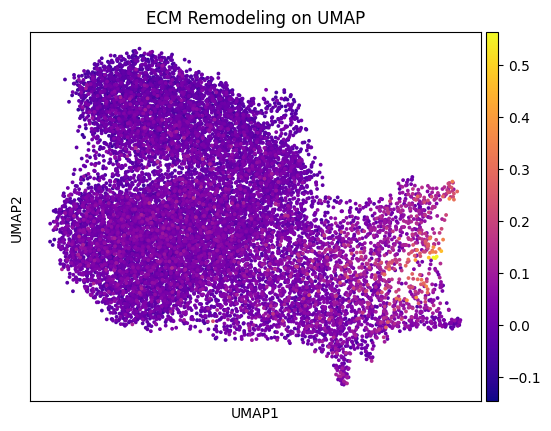

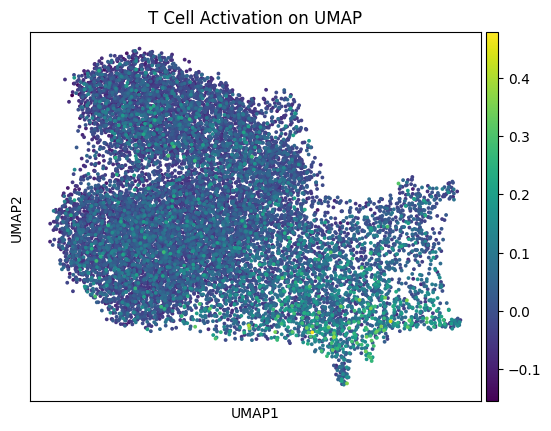

In [48]:
# EMT Score
sc.pl.umap(
    banksy_adata,
    color='EMT_score',
    cmap='magma',
    size=30,
    title="EMT Activity on UMAP",
    show=True
)

# ECM Score
sc.pl.umap(
    banksy_adata,
    color='ECM_score',
    cmap='plasma',
    size=30,
    title="ECM Remodeling on UMAP",
    show=True
)

# T Cell Score
sc.pl.umap(
    banksy_adata,
    color='Tcell_score',
    cmap='viridis',
    size=30,
    title="T Cell Activation on UMAP",
    show=True
)

C:\Users\suhas\AppData\Local\Temp\ipykernel_9208\1662137190.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = banksy_adata.obs.groupby("leiden")[["EMT_score", "ECM_score", "Tcell_score"]].mean()


        EMT_score  ECM_score  Tcell_score
leiden                                   
0       -0.009180  -0.007515    -0.011645
1        0.000362  -0.025238    -0.022962
2       -0.011173  -0.003274    -0.015741
3       -0.007119  -0.014564    -0.010068
4        0.010625   0.014952     0.055796
5        0.037562   0.081735     0.017153
6       -0.002856   0.012398     0.022541
7        0.016076   0.064264     0.082956


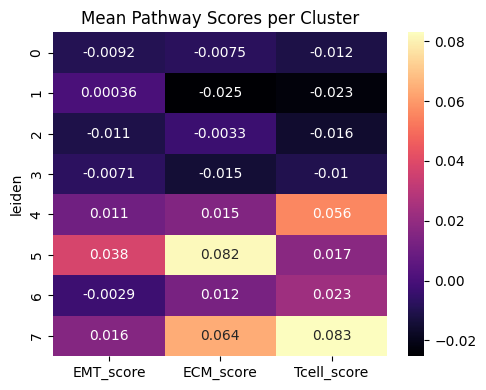

In [49]:
import pandas as pd
import seaborn as sns
# Compute mean scores per cluster
summary = banksy_adata.obs.groupby("leiden")[["EMT_score", "ECM_score", "Tcell_score"]].mean()
print(summary)

# Plot as heatmap
plt.figure(figsize=(5,4))
sns.heatmap(summary, annot=True, cmap="magma")
plt.title("Mean Pathway Scores per Cluster")
plt.tight_layout()
plt.show()

In [53]:
sc.pp.scale(banksy_adata, zero_center=True, max_value=5)
mean_expr = banksy_adata.to_df()[top_genes].groupby(banksy_adata.obs["leiden"]).mean()

C:\Users\suhas\AppData\Local\Temp\ipykernel_9208\3314224893.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_expr = banksy_adata.to_df()[top_genes].groupby(banksy_adata.obs["leiden"]).mean()


In [54]:
print(mean_expr)

        IGKC_nbr  IGHG1_nbr  CHGA_nbr   VGF_nbr   FGB_nbr  IGHG3_nbr  \
leiden                                                                 
0      -0.187511  -0.197781  0.768984  0.188158 -0.217206  -0.129783   
1      -0.537269  -0.526131 -0.652981 -0.542948 -0.474076  -0.227067   
2       0.026785   0.027827  0.819131  0.696298  0.764481  -0.011487   
3      -0.519247  -0.493241 -0.610795 -0.639190 -0.013366  -0.230926   
4       0.972779   1.002144 -0.366140  0.315623  0.338494   0.304687   
5       0.883281   0.739841 -0.568421 -0.059716 -0.291924   0.217419   
6      -0.245105  -0.305257 -0.609544 -0.498285 -0.230644  -0.237234   
7       3.037766   3.216327 -1.271547 -0.167110 -0.602109   2.569006   

        IGLC1_nbr  JCHAIN_nbr  CARTPT_nbr   CPE_nbr  RGS5_nbr   CGA_nbr  \
leiden                                                                    
0       -0.228965   -0.242631    0.595168  0.661574 -0.265542  0.130068   
1       -0.280283   -0.317781    0.254800 -0.802920 -0

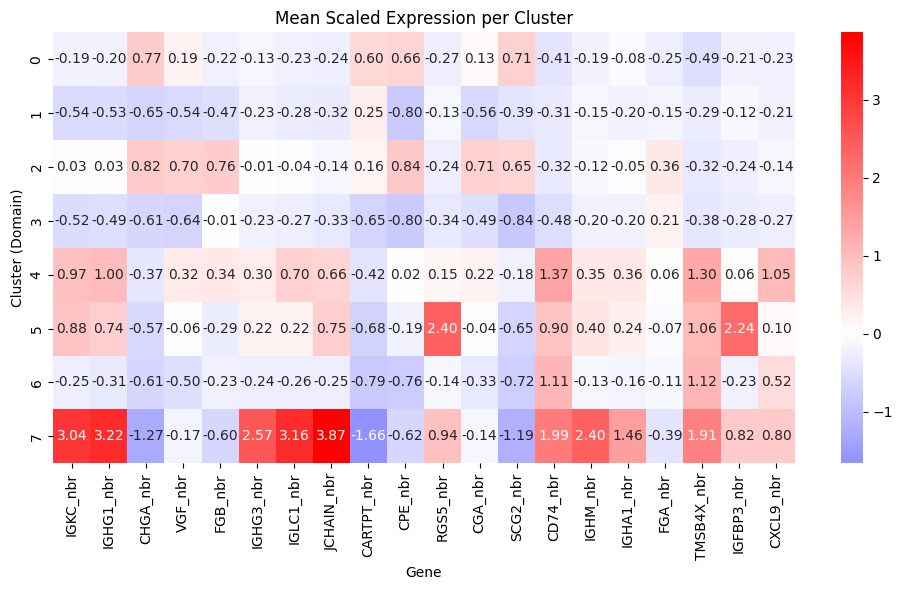

In [55]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.heatmap(mean_expr, cmap="bwr", center=0, annot=True, fmt=".2f")  # `center=0` for diverging
plt.title("Mean Scaled Expression per Cluster")
plt.ylabel("Cluster (Domain)")
plt.xlabel("Gene")
plt.tight_layout()
plt.show()

In [56]:
import pandas as pd

# Load signature CSV
signatures = pd.read_csv("signatures.csv")

# Preview
print(signatures.head())


  TLS_mature    TLS TGFB_CAFs    CAF ecm_myCAF detox_iCAF IL_iCAF TGFβ_myCAF  \
0        CR2    TSG     MMP11   ENAH      ASPN      ADH1B   ITM2A       CST1   
1      FCER2  CXCR5   COL11A1  ITGB1    COL3A1         C7  CXCL12      LAMP5   
2     CXCL13   CCR7   C1QTNF3  ACTA2      THY1     CXCL12    FIGF      LOXL1   
3       BCL6  CD79B   COL12A1    FAP     SFRP2       TNXB   FXYD1      EDNRA   
4      MS4A1  CCL18   COL10A1    IL6   COL10A1      RSPO3   PLPP3      TGFB1   

  wound_myCAF IFNγ_iCAF  
0       SFRP4     CCL19  
1      CCDC80     VCAM1  
2         OGN      RBP5  
3         DCN    CYP1B1  
4      PTGER3        C7  


In [57]:
# Drop all-NaN column
signatures.dropna(how="all", inplace=True)

signature_dict = {}

for col in signatures.columns:

    genes = signatures[col].dropna().tolist()
    signature_dict[col] = genes


print({k: signature_dict[k][:5] for k in signature_dict})

{'TLS_mature': ['CR2', 'FCER2', 'CXCL13', 'BCL6', 'MS4A1'], 'TLS': ['TSG', 'CXCR5', 'CCR7', 'CD79B', 'CCL18'], 'TGFB_CAFs': ['MMP11', 'COL11A1', 'C1QTNF3', 'COL12A1', 'COL10A1'], 'CAF': ['ENAH', 'ITGB1', 'ACTA2', 'FAP', 'IL6'], 'ecm_myCAF': ['ASPN', 'COL3A1', 'THY1', 'SFRP2', 'COL10A1'], 'detox_iCAF': ['ADH1B', 'C7', 'CXCL12', 'TNXB', 'RSPO3'], 'IL_iCAF': ['ITM2A', 'CXCL12', 'FIGF', 'FXYD1', 'PLPP3'], 'TGFβ_myCAF': ['CST1', 'LAMP5', 'LOXL1', 'EDNRA', 'TGFB1'], 'wound_myCAF': ['SFRP4', 'CCDC80', 'OGN', 'DCN', 'PTGER3'], 'IFNγ_iCAF': ['CCL19', 'VCAM1', 'RBP5', 'CYP1B1', 'C7']}


In [59]:
from sklearn.preprocessing import scale
import numpy as np

# Z-score normalize (genes along axis=0)
banksy_adata.X = scale(banksy_adata.X, axis=0)

# Score each signature
for sig, gene_list in signature_dict.items():
    valid_genes = [g for g in gene_list if g in banksy_adata.var_names]
    if valid_genes:
        banksy_adata.obs[f"{sig}_score"] = banksy_adata[:, valid_genes].X.mean(axis=1)
    else:
        print(f"Signature '{sig}' has no matching genes in adata.")

C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


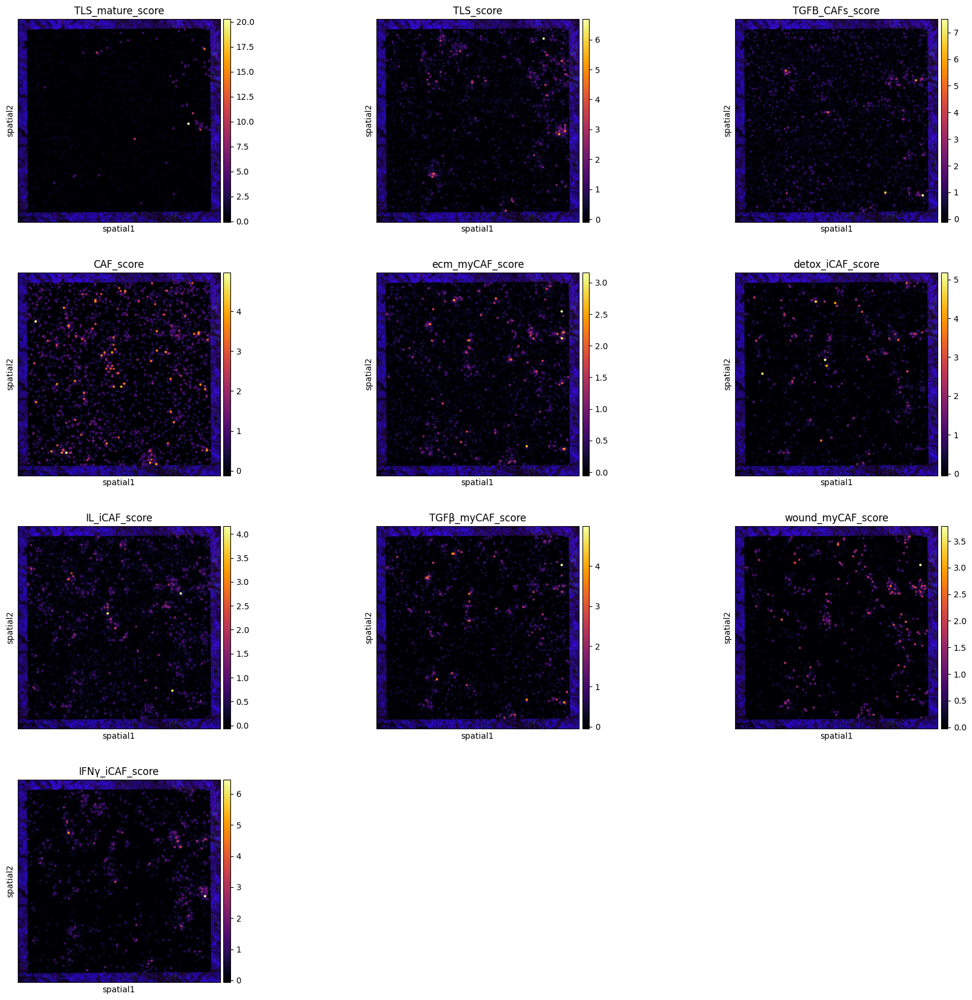

In [60]:
sc.pl.spatial(
    banksy_adata,
    color=[f"{sig}_score" for sig in signature_dict],
    cmap="inferno",
    ncols=3,
    spot_size=40
)

In [61]:
import pandas as pd


signature_score_cols = [f"{sig}_score" for sig in signature_dict.keys()]


banksy_adata.obs["niche_type"] = banksy_adata.obs[signature_score_cols].idxmax(axis=1)


banksy_adata.obs["niche_type"] = banksy_adata.obs["niche_type"].str.replace("_score", "")

In [63]:
from scipy.spatial import cKDTree
import numpy as np

# Coordinates
coords = banksy_adata.obsm["spatial"]
labels = banksy_adata.obs["leiden"].astype(int)


niche_cluster_ids = [4, 5, 6,7]
host_cluster_ids = [0,1, 2, 3]

niche_indices = np.where(np.isin(labels, niche_cluster_ids))[0]
host_coords = coords[np.isin(labels, host_cluster_ids)]

tree = cKDTree(host_coords)


radius = 50

# Find niche cells near host cells
niche_near_host = []
for idx in niche_indices:
    dist, _ = tree.query(coords[idx], distance_upper_bound=radius)
    niche_near_host.append(np.isfinite(dist))


banksy_adata.obs["niche_in_host123"] = False
banksy_adata.obs.iloc[np.array(niche_indices)[niche_near_host], banksy_adata.obs.columns.get_loc("niche_in_host123")] = True

In [64]:

banksy_adata.obs["niche_type_in_host123"] = None
banksy_adata.obs.loc[banksy_adata.obs["niche_in_host123"], "niche_type_in_host123"] = banksy_adata.obs["niche_type"]

C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


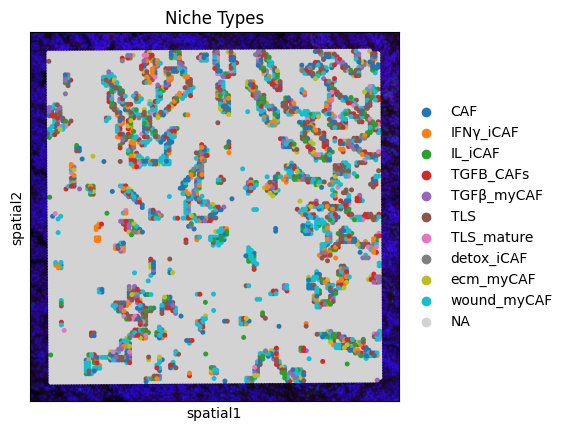

In [65]:

banksy_adata.obs["niche_type_in_host123"] = banksy_adata.obs["niche_type_in_host123"].astype("category")

sc.pl.spatial(
    banksy_adata,
    color="niche_type_in_host123",
    title="Niche Types",
    spot_size=45,
    na_color="lightgrey"
)

C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
C:\Users\suhas\anaconda3\envs\banksy_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


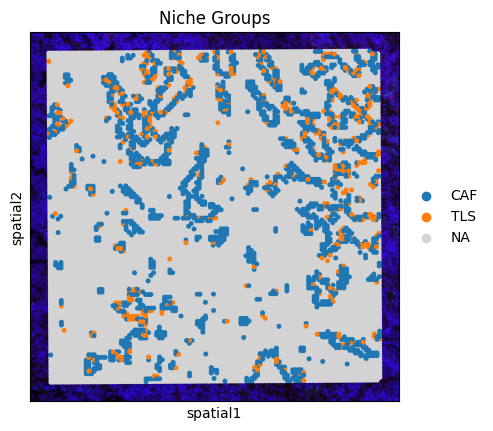

In [66]:
import pandas as pd

# Define mapping: all CAF flavors → "CAF", all TLS flavors → "TLS"
map_dict = {
    "CAF": "CAF",
    "IFNγ_iCAF": "CAF",
    "IL_iCAF": "CAF",
    "TGFB_CAFs": "CAF",
    "TGFB_myCAF": "CAF",
    "ecm_myCAF": "CAF",
    "wound_myCAF": "CAF",
    "detox_iCAF": "CAF",
    
    "TLS": "TLS",
    "TLS_mature": "TLS",
    
    "NA": "NA" 
}


banksy_adata.obs["niche_group"] = banksy_adata.obs["niche_type_in_host123"].map(map_dict)
banksy_adata.obs["niche_group"] = banksy_adata.obs["niche_group"].astype("category")


sc.pl.spatial(
    banksy_adata,
    color="niche_group",
    title="Niche Groups",
    spot_size=45,
    na_color="lightgrey"
)